In [1]:
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from numpy import cos
from math import log
from scipy.interpolate import interp1d
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
from mpl_toolkits.mplot3d import Axes3D
from scipy.optimize import minimize_scalar
from scipy.optimize import minimize
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from sage.plot.plot3d.parametric_surface import ParametricSurface
import plotly.graph_objects as go
import plotly.express as px

In [2]:
def model(t, z, T_linha, T1, T2, omega1, phi1, R1, R2, omega2, phi2,
                   B_E, p_ME, p_ML, p_MP, tau_E, tau_P, c1, c2,
                   D1, b1, A, B, C, b2, tau_H, DD, Tmin, gamma, R_L,
                   N, M, E_M0, I_H0, I_M0):
    
    S_H, I_H, R_H, S_M, E_M, I_M = z
    
    # Funções de temperatura e chuva
    def Temp(t):
        return T1 * (1 + T2 * cos(omega1 * t - phi1))

    def Rain(t):
        return R1 * (1 + R2 * cos(omega2 * t - phi2))

    R_curr = Rain(t)
    T_curr = Temp(t)
    
    # Duração da fase de desenvolvimento das larvas
    def tau_L(Temp):
        return 1 / (c1 * Temp + c2)
    
    # Taxa diária de sobrevivência dos mosquitos
    def p(Temp):
        return np.exp(-1 / (A*Temp**2 + B*Temp + C))
    
    # Probabilidade de sobrevivência das larvas dependente de temperatura e chuva
    def p_LT(Temp):
        return np.exp(-(c1 * Temp + c2))
    
    def p_LR(Rain):
        return (4*p_ML/R_L**2) * Rain * (max(10^-5,R_L - Rain))
    
    def p_LRT(Rain,Temp):
        return p_LR(Rain)*p_LT(Temp)
    
    # Probabilidade de sobrevivência dos ovos e pupas dependente de chuva (Não definido previamente)
    def p_ER(Rain):
        return (4*p_ME/R_L**2) * Rain * (max(10^-5,R_L - Rain))
    
    # Probabilidade de sobrevivência dos ovos e pupas dependente de chuva (Não definido previamente)
    def p_PR(Rain):
        return (4*p_MP/R_L**2) * Rain * (max(10^-5,R_L - Rain))

    # Duração do ciclo esporogônico
    def tau_M(Temp):
        return DD / (max(10^-5,Temp - Tmin))
    
    tau_M_curr = tau_M(T_curr)

    # Taxa de infecção de expostos (1/Duração do ciclo esporogônico)
    def b3(tau_M, Temp):
        return 1/tau_M
    
    b3_curr = b3(tau_M_curr, T_curr)
    
    # Definindo a função de sobrevivência do mosquito
    def l_tau_M(tau_M, Temp):  
        p_T = p(Temp)
        return p_T**tau_M
    
    l_curr = l_tau_M(tau_M_curr, T_curr)

    # Definindo a taxa de mortalidade do mosquito
    def mu(Temp):
        return -log(p(Temp))
    
    mu_curr = mu(T_curr)
    
    # Calcula a taxa de picada e probabilidade de transmissão
    def a(Temp):
        return (max(10^-5, Temp - T_linha)) / D1
    
    a_curr = a(T_curr)
    
    def b(Rain,Temp):
        return B_E * p_ER(Rain) * p_LRT(Rain,Temp) * p_PR(Rain) / (tau_E + tau_L(Temp) + tau_P)
    
    b_curr = b(R_curr, T_curr)
    
    dShdt = -a_curr * b2 * (I_M / N) * S_H
    dIhdt = a_curr * b2 * (I_M / N) * S_H - gamma * I_H
    dRhdt = gamma * I_H
    
    dSmdt = b_curr - a_curr * b1 * (I_H / N) * S_M - mu_curr * S_M
    dEmdt = a_curr * b1 * (I_H / N) * S_M - mu_curr * E_M - b3_curr * E_M - l_curr * E_M
    dImdt = b3_curr * E_M - mu_curr * I_M
    
    return [dShdt, dIhdt, dRhdt, dSmdt, dEmdt, dImdt] 

In [3]:
T_linha = 25.6
T1= 26.4 
T2= 0.025
omega1= 0.017
phi1= -1.45

R1= 280.083 
R2= 0.555
omega2= 0.017
phi2=1.6

B_E=200
p_ME=0.9
p_ML=0.75
p_MP=0.85
tau_E=1
tau_P=1
# c1=0.019
# c2=-0.021
c1=0.00554
c2=-0.06737

D1=36.5
b1=0.04

A=15
B=15
C=-48.78

# A=-0.03
# B=1.31
# C=-4.4

b2=0.09
tau_H=10
DD=105
Tmin=14.5
gamma= 1/120 
R_L = 450
N = 8558
M = 300000 
E_M0 = 50000
I_H0 = 1000 
I_M0 = 2500
if E_M0 is None:
        E_M0 = M / 100

S_H0 = N - I_H0
S_M0 = M - E_M0 - I_M0

In [4]:
def R0_sir(a, b2, gamma):
    return abs((a * b2) / gamma)
    
#R0_sir_curr = R0_sir(a_curr, b2, gamma)
    
def R0_sei(a, b1, b3, l, mu):
    return abs((a * b1 * b3) / ((b3 + l) * mu + mu** 2))
    
#R0_sei_curr = R0_sei(a_curr, b1, b3_curr, l_curr, mu_curr)
    
def R0_full(a, b1, b2, b3, gamma, l, mu):
    return abs(((a** 2 * b1 * b2 * b3) / (b3 * gamma * mu + gamma * l * mu + gamma * mu** 2))**(1/2))
    
#R0_curr = R0(a_curr, b1, b2, b3_curr, gamma, l_curr, mu_curr)

In [5]:
def calculate_initial_values(R_L, T_linha, Tmin, DD, D1, T1, T2, omega1, phi1, R1, R2, omega2, phi2,
                            p_ML, p_ME, p_MP, c1, c2, A, B, C, b1, b2, gamma):
    
    T0 = T1 * (1 + T2 * cos(omega1 * 0 - phi1))
    R0 = R1 * (1 + R2 * cos(omega2 * 0 - phi2))

    tau_L0 = 1 / (c1 * T0 + c2)

    p_LT0 = np.exp(-(c1 * T0 + c2))
    
    p_LR0 = (4 * p_ML / R_L**2) * R0 * (max(1e-5, R_L - R0))
    
    p_LRT0 = p_LR0 * p_LT0
    
    p_ER0 = (4 * p_ME / R_L**2) * R0 * (max(1e-5, R_L - R0))
    
    p_PR0 = (4 * p_MP / R_L**2) * R0 * (max(1e-5, R_L - R0))

    a0 = (max(1e-5, T0 - T_linha)) / D1
    b0 = B_E * p_ER0 * p_LRT0 * p_PR0 / (tau_E + tau_L0 + tau_P)

    tau_M0 = DD / (max(1e-5, T0 - Tmin))
    
    b30 =  1 / tau_M0
    
    p0 = np.exp(-1 / (A * T0**2 + B * T0 + C))
    l0 = p0 ** tau_M0

    mu0 = -log(p0)

    initial_R0_sir = R0_sir(a0, b2, gamma)
    initial_R0_sei = R0_sei(a0, b1, b30, l0, mu0)
    initial_R0_full = R0_full(a0, b1, b2, b30, gamma, l0, mu0)
    
    return initial_R0_sir, initial_R0_sei, initial_R0_full, a0

In [6]:
initial_R0_sir, initial_R0_sei, initial_R0_full, a0 = calculate_initial_values(R_L, T_linha, Tmin, DD, D1, 
                                                                           T1, T2, omega1, phi1, R1, R2, omega2, phi2,
                                                                           p_ML, p_ME, p_MP, c1, c2, A, B, C, b1, b2, gamma)

In [7]:
print(f'R0_sir = {initial_R0_sir} \nR0_sei = {initial_R0_sei}\nR0_acoplado = {initial_R0_full}\nTaxa de picadas = {a0}')

R0_sir = 0.26024503397398857 
R0_sei = 1.0732299265703247
R0_acoplado = 0.5284910204555943
Taxa de picadas = 0.02409676240499894


In [8]:
initial_R0_sir, initial_R0_sei, initial_R0_full, a0 = calculate_initial_values(R_L, T_linha, Tmin, DD, D1, 
                                                                           T1, T2, omega1, phi1, R1, R2, omega2, phi2,
                                                                           p_ML, p_ME, p_MP, c1, c2, A, B, C, 0.06, 0.1, gamma)

In [9]:
print(f'R0_sir = {initial_R0_sir} \nR0_sei = {initial_R0_sei}\nR0_acoplado = {initial_R0_full}\nTaxa de picadas = {a0}')

R0_sir = 0.28916114885998734 
R0_sei = 1.609844889855487
R0_acoplado = 0.6822789736148933
Taxa de picadas = 0.02409676240499894


In [10]:
initial_R0_sir, initial_R0_sei, initial_R0_full, a0 = calculate_initial_values(R_L, T_linha, Tmin, DD, D1, 
                                                                           T1, T2, omega1, phi1, R1, R2, omega2, phi2,
                                                                           p_ML, p_ME, p_MP, c1, c2, A, B, C, 0.06, 0.12, gamma)

In [11]:
print(f'R0_sir = {initial_R0_sir} \nR0_sei = {initial_R0_sei}\nR0_acoplado = {initial_R0_full}\nTaxa de picadas = {a0}')

R0_sir = 0.34699337863198476 
R0_sei = 1.609844889855487
R0_acoplado = 0.7473991687206982
Taxa de picadas = 0.02409676240499894


In [12]:
def model_plot_rates(t, z, T_linha, T1, T2, omega1, phi1, R1, R2, omega2, phi2,
                   B_E, p_ME, p_ML, p_MP, tau_E, tau_P, c1, c2,
                   D1, b1, A, B, C, b2, tau_H, DD, Tmin, gamma, R_L,
                   N, M, E_M0, I_H0, I_M0):
    
    S_H, I_H, R_H, S_M, E_M, I_M, a_curr, b3_curr, tau_M_curr = z
    
    # Funções de temperatura e chuva
    def Temp(t):
        return T1 * (1 + T2 * cos(omega1 * t - phi1))

    def Rain(t):
        return R1 * (1 + R2 * cos(omega2 * t - phi2))

    R_curr = Rain(t)
    T_curr = Temp(t)
    
    # Duração da fase de desenvolvimento das larvas
    def tau_L(Temp):
        return 1 / (c1 * Temp + c2)
    
    # Taxa diária de sobrevivência dos mosquitos
    def p(Temp):
        return np.exp(-1 / (A*Temp**2 + B*Temp + C))
    
    # Probabilidade de sobrevivência das larvas dependente de temperatura e chuva
    def p_LT(Temp):
        return np.exp(-(c1 * Temp + c2))
    
    def p_LR(Rain):
        return (4*p_ML/R_L**2) * Rain * (max(10^-5,R_L - Rain))
    
    def p_LRT(Rain,Temp):
        return p_LR(Rain)*p_LT(Temp)
    
    # Probabilidade de sobrevivência dos ovos e pupas dependente de chuva (Não definido previamente)
    def p_ER(Rain):
        return (4*p_ME/R_L**2) * Rain * (max(10^-5,R_L - Rain))
    
    # Probabilidade de sobrevivência dos ovos e pupas dependente de chuva (Não definido previamente)
    def p_PR(Rain):
        return (4*p_MP/R_L**2) * Rain * (max(10^-5,R_L - Rain))

    # Duração do ciclo esporogônico
    def tau_M(Temp):
        return DD / (max(10^-5,Temp - Tmin))
    
    tau_M_curr = tau_M(T_curr)

    # Taxa de infecção de expostos (1/Duração do ciclo esporogônico)
    def b3(tau_M, Temp):
        return 1/tau_M
    
    b3_curr = b3(tau_M_curr, T_curr)
    
    # Definindo a função de sobrevivência do mosquito
    def l_tau_M(tau_M, Temp):  
        p_T = p(Temp)
        return p_T**tau_M
    
    l_curr = l_tau_M(tau_M_curr, T_curr)

    # Definindo a taxa de mortalidade do mosquito
    def mu(Temp):
        return -log(p(Temp))
    
    mu_curr = mu(T_curr)
    
    # Calcula a taxa de picada e probabilidade de transmissão
    def a(Temp):
        return (max(10^-5, Temp - T_linha)) / D1
    
    a_curr = a(T_curr)
    
    def b(Rain,Temp):
        return B_E * p_ER(Rain) * p_LRT(Rain,Temp) * p_PR(Rain) / (tau_E + tau_L(Temp) + tau_P)
    
    b_curr = b(R_curr, T_curr)
    
    dShdt = -a_curr * b2 * (I_M / N) * S_H
    dIhdt = a_curr * b2 * (I_M / N) * S_H - gamma * I_H
    dRhdt = gamma * I_H
    
    dSmdt = b_curr - a_curr * b1 * (I_H / N) * S_M - mu_curr * S_M
    dEmdt = a_curr * b1 * (I_H / N) * S_M - mu_curr * E_M - b3_curr * E_M - l_curr * E_M
    dImdt = b3_curr * E_M - mu_curr * I_M
    
#     print(T_curr)
#     print(a_curr)
#     print(' ')
    
    return [dShdt, dIhdt, dRhdt, dSmdt, dEmdt, dImdt, a_curr, b3_curr, tau_M_curr]

In [13]:
args = (T_linha, T1, T2, omega1, phi1, R1, R2, omega2, phi2,
                   B_E, p_ME, p_ML, p_MP, tau_E, tau_P, c1, c2,
                   D1, 0.06, A, B, C, 0.12, tau_H, DD, Tmin, gamma, R_L,
                   N, M, E_M0, I_H0, I_M0)

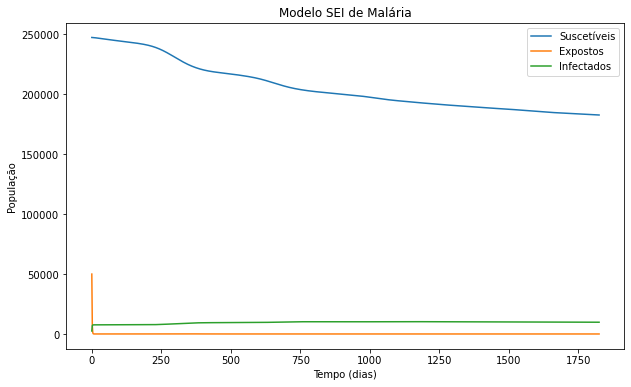

In [14]:
t_eval = np.linspace(0, 1825, 1000)  # Avalia a solução em 1000 pontos entre 0 e 10825
sol = solve_ivp(model_plot_rates, [0, 1825], [N, 0, 0, S_M0, E_M0, I_M0, 0, 0, 0], args=args, dense_output=True, t_eval=t_eval, method="DOP853")
#sol

times = sol.t
S_H, I_H, R_H, S_M, E_M, I_M, a_values, b3_values, tau_M_values = sol.y

plt.figure(figsize=(10, 6))
plt.plot(times, S_M, label='Suscetíveis')
plt.plot(times, E_M, label='Expostos')
plt.plot(times, I_M, label='Infectados')

plt.xlabel('Tempo (dias)')
plt.ylabel('População')
plt.title('Modelo SEI de Malária')

plt.legend()

plt.show()

In [15]:
# Executa o novo modelo com resultados das taxas
sol = solve_ivp(model_plot_rates, [0, 1825], [N, 0, 0, S_M0, E_M0, I_M0, 0.0241, 0, 0], args=args, dense_output=True, t_eval=t_eval, method="DOP853")

a_values = sol.y[6]
b3_values = sol.y[7]
tau_M_values = sol.y[8]

In [16]:
# plt.figure(figsize=(10, 6))
# plt.plot(sol.t, a_values, label='Taxa de picadas (a(T))')
# plt.xlabel('t (dias)')
# plt.ylabel('Taxa de picadas')
# plt.title('Taxa de picadas ao longo do tempo')
# plt.legend()
# plt.show()

# plt.figure(figsize=(10, 6))
# plt.plot(sol.t, b3_values, label='Taxa de infecção de mosquitos expostos (b3)')
# plt.xlabel('t (dias)')
# plt.ylabel('Taxa de infecção (b3)')
# plt.title('Taxa de infecção de mosquitos expostos ao longo do tempo')
# plt.legend()
# plt.show()

# plt.figure(figsize=(10, 6))
# plt.plot(sol.t, tau_M_values, label='Duração do ciclo esporogônico (tau_M)')
# plt.xlabel('t (dias)')
# plt.ylabel('Duração do ciclo esporogônico')
# plt.title('Duração do ciclo esporogônico ao longo do tempo')
# plt.legend()
# plt.show()

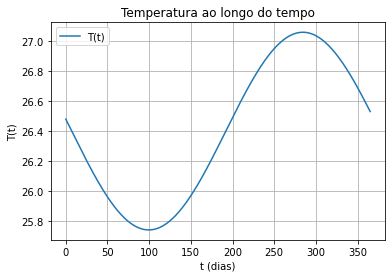

In [17]:
def T(t):
        return T1 * (1 + T2 * cos(omega1 * t - phi1))
        
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
T_values = [T(t) for t in t_values]

# Plotando
plt.plot(t_values, T_values, label='T(t)')
plt.title('Temperatura ao longo do tempo')
plt.xlabel('t (dias)')
plt.ylabel('T(t)')
plt.legend()
plt.grid(True)
plt.show()

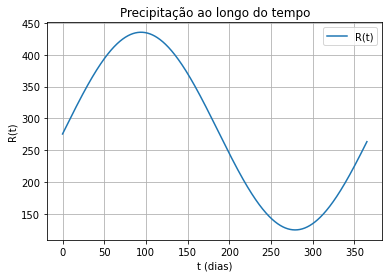

In [18]:
def R(t):
        return R1 * (1 + R2 * cos(omega2 * t - phi2))
        
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
R_values = [R(t) for t in t_values]

# Plotando
plt.plot(t_values, R_values, label='R(t)')
plt.title('Precipitação ao longo do tempo')
plt.xlabel('t (dias)')
plt.ylabel('R(t)')
plt.legend()
plt.grid(True)
plt.show()

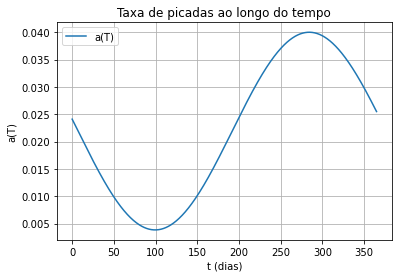

In [19]:
def biting_rate(t):
        return (max(1e-5, T(t)-T_linha))/D1
        
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
biting_values = [biting_rate(t) for t in t_values]

# Plotando
plt.plot(t_values, biting_values, label='a(T)')
plt.title('Taxa de picadas ao longo do tempo')
plt.xlabel('t (dias)')
plt.ylabel('a(T)')
plt.legend()
plt.grid(True)
plt.show()

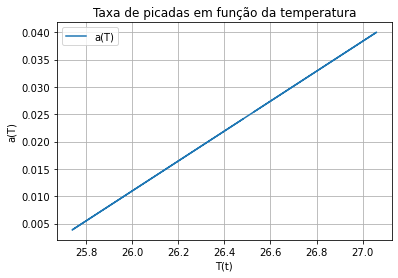

In [20]:
def biting_rate_from_temperature(temperature):
    return (max(1e-5, temperature - T_linha)) / D1

# Usando T_values previamente calculados
biting_values_from_temperature = [biting_rate_from_temperature(temp) for temp in T_values]

plt.plot(T_values, biting_values_from_temperature, label='a(T)')
plt.title('Taxa de picadas em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('a(T)')
plt.legend()
plt.grid(True)
plt.show()

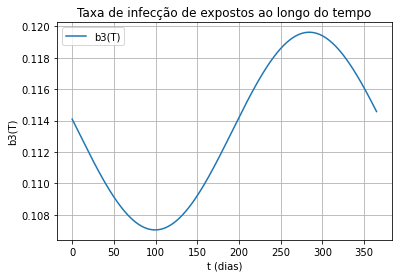

In [21]:
def exposed_to_infected_rate(t):
        return  (max(1e-5, T(t)-Tmin))/DD
    
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
infection_values = [exposed_to_infected_rate(t) for t in t_values]

# Plotando
plt.plot(t_values, infection_values, label='b3(T)')
plt.title('Taxa de infecção de expostos ao longo do tempo')
plt.xlabel('t (dias)')
plt.ylabel('b3(T)')
plt.legend()
plt.grid(True)
plt.show()

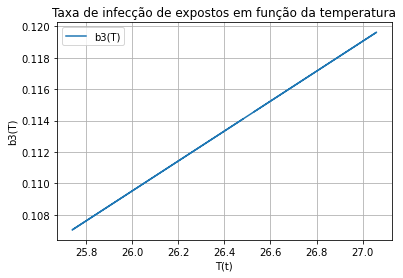

In [22]:
def exposed_to_infected_rate_from_temperature(temperature):
    return (max(1e-5, temperature-Tmin))/DD

# Usando T_values previamente calculados
exposed_to_infected_values_from_temperature = [exposed_to_infected_rate_from_temperature(temp) for temp in T_values]

plt.plot(T_values, exposed_to_infected_values_from_temperature, label='b3(T)')
plt.title('Taxa de infecção de expostos em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('b3(T)')
plt.legend()
plt.grid(True)
plt.show()

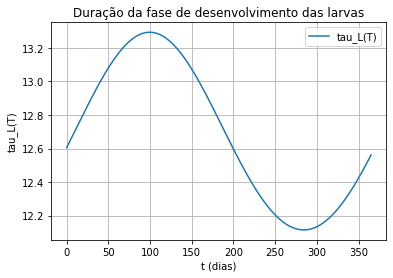

In [23]:
def larvae_development_rate(t):
        return 1 / (c1 * T(t) + c2)

# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
larvae_dev = [larvae_development_rate(t) for t in t_values]

# Plotando
plt.plot(t_values, larvae_dev, label='tau_L(T)')
plt.title('Duração da fase de desenvolvimento das larvas')
plt.xlabel('t (dias)')
plt.ylabel('tau_L(T)')
plt.legend()
plt.grid(True)
plt.show()

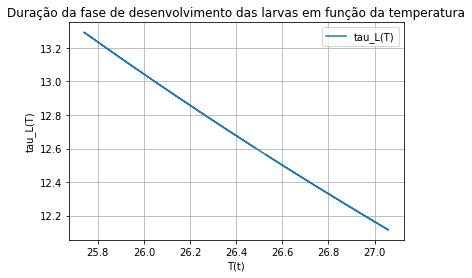

In [24]:
def larvae_development_rate_from_temperature(temperature):
    return 1 / (c1 * temperature + c2)

# Usando T_values previamente calculados
larvae_dev_values_from_temperature = [larvae_development_rate_from_temperature(temp) for temp in T_values]

plt.plot(T_values, larvae_dev_values_from_temperature, label='tau_L(T)')
plt.title('Duração da fase de desenvolvimento das larvas em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('tau_L(T)')
plt.legend()
plt.grid(True)
plt.show()

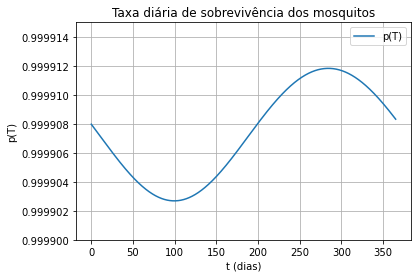

In [25]:
def daily_survival_rate(t):
    return np.exp(-1 / (A * T(t)**2 + B * T(t) + C))

# Set up the time points
t_values = np.linspace(0, 365, 1000)

# Calculate daily survival rates
daily_survival = [daily_survival_rate(t) for t in t_values]

# Plotando
plt.plot(t_values, daily_survival, label='p(T)')
plt.title('Taxa diária de sobrevivência dos mosquitos')
plt.xlabel('t (dias)')
plt.ylabel('p(T)')
plt.legend()
plt.grid(True)

# Set y-axis limits
plt.ylim(0.9999, 0.999915)

plt.ticklabel_format(useOffset=False, style='plain')

plt.show()

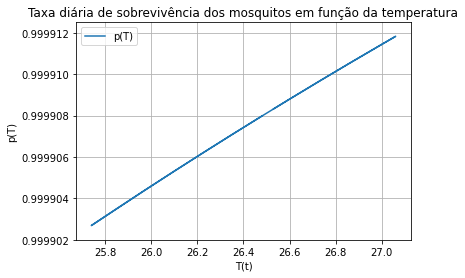

In [26]:
def daily_survival_rate_from_temperature(temperature):
    return np.exp(-1 / (A * temperature**2 + B * temperature + C))

# Usando T_values previamente calculados
daily_survival_from_temperature = [daily_survival_rate_from_temperature(temp) for temp in T_values]

plt.plot(T_values, daily_survival_from_temperature, label='p(T)')
plt.title('Taxa diária de sobrevivência dos mosquitos em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('p(T)')
plt.legend()
plt.grid(True)

# Set y-axis limits
plt.ylim(0.999902, 0.9999125)

plt.ticklabel_format(useOffset=False, style='plain')

plt.show()

In [27]:
# def p_LT(t):
#     return np.exp(-(c1 * T(t) + c2))
    
# def p_LR(t):
#     return (4*p_ML/R_L**2) * R(t) * (max(1e-5,R_L - R(t)))
    
# def p_LRT(t):
#     return p_LR(t)*p_LT(t)

# # Pontos no tempo
# t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
# larvae_survival = [p_LRT(t) for t in t_values]

# # Plotando
# plt.plot(t_values, larvae_survival, label='p_LRT(R,T)')
# plt.title('Probabilidade de sobrevivência das larvas')
# plt.xlabel('t (dias)')
# plt.ylabel('p_LRT(R,T)')
# plt.legend()
# plt.grid(True)
# plt.show()

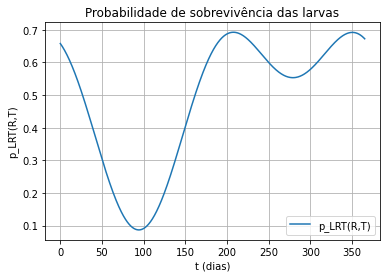

In [28]:
def p_LT_teste(t):
    return np.exp(-(c1 * T(t) + c2))
    
def p_LR_teste(t):
    return (4*p_ML/R_L**2) * R(t) * (R_L - R(t))
    
def p_LRT_teste(t):
    return p_LR_teste(t)*p_LT_teste(t)

# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
larvae_survival = [p_LRT_teste(t) for t in t_values]

# Plotando
plt.plot(t_values, larvae_survival, label='p_LRT(R,T)')
plt.title('Probabilidade de sobrevivência das larvas')
plt.xlabel('t (dias)')
plt.ylabel('p_LRT(R,T)')
plt.legend()
plt.grid(True)
plt.show()

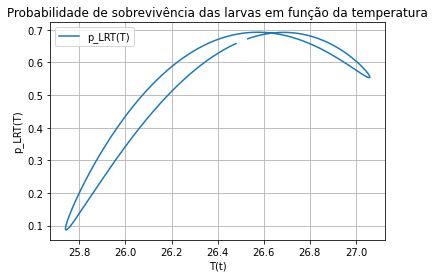

In [29]:
def p_LT_from_temperature(temperature):
    return np.exp(-(c1 * temperature + c2))
    
def p_LR_from_rain(rain):
    return (4*p_ML/R_L**2) * rain * (max(1e-5, R_L - rain))    

def p_LRT_full(rain, temperature):
    return p_LR_from_rain(rain)*p_LT_from_temperature(temperature)
    
# Usando R_values e T_values previamente calculados
larvae_survival_from_rain_and_temperature = [p_LRT_full(precip, temp) for precip, temp in zip(R_values, T_values)]

plt.plot(T_values, larvae_survival_from_rain_and_temperature, label='p_LRT(T)')
plt.title('Probabilidade de sobrevivência das larvas em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('p_LRT(T)')
plt.legend()
plt.grid(True)

plt.show()

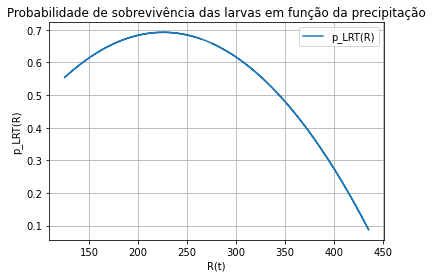

In [30]:
plt.plot(R_values, larvae_survival_from_rain_and_temperature, label='p_LRT(R)')
plt.title('Probabilidade de sobrevivência das larvas em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('p_LRT(R)')
plt.legend()
plt.grid(True)

plt.show()

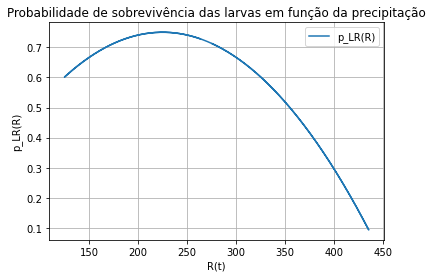

In [31]:
# Usando R_values e T_values previamente calculados
larvae_survival_from_rain = [p_LR_from_rain(precip) for precip in R_values]

plt.plot(R_values, larvae_survival_from_rain, label='p_LR(R)')
plt.title('Probabilidade de sobrevivência das larvas em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('p_LR(R)')
plt.legend()
plt.grid(True)

plt.show()    

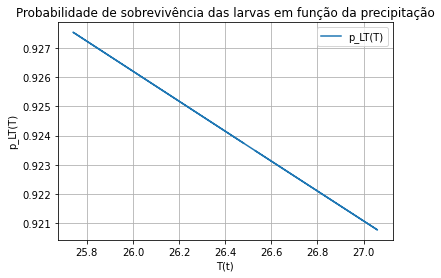

In [32]:
# Usando R_values e T_values previamente calculados
larvae_survival_from_temperature = [p_LT_from_temperature(temp) for temp in T_values]

plt.plot(T_values, larvae_survival_from_temperature, label='p_LT(T)')
plt.title('Probabilidade de sobrevivência das larvas em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('p_LT(T)')
plt.legend()
plt.grid(True)

plt.show()    

In [33]:
#sorted_values = sorted(zip(R_values, T_values))
#R_values_sorted, T_values_sorted = zip(*sorted_values)

R_values_sorted = sorted(R_values)
T_values_sorted = sorted(T_values)

R_values_array = np.array(R_values_sorted)
T_values_array = np.array(T_values_sorted)

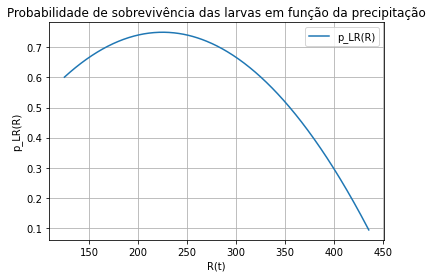

In [34]:
# Calculando a probabilidade de sobrevivência em função unicamente da chuva

# Usando R_values e T_values previamente calculados
larvae_survival_from_rain_sorted = [p_LR_from_rain(precip) for precip in R_values_array]

plt.plot(R_values_array, larvae_survival_from_rain_sorted, label='p_LR(R)')
plt.title('Probabilidade de sobrevivência das larvas em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('p_LR(R)')
plt.legend()
plt.grid(True)

plt.show()    

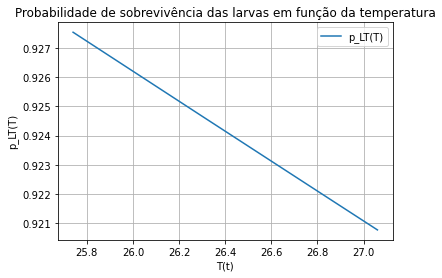

In [35]:
# Calculando a probabilidade de sobrevivência em função unicamente da temperatura

# Usando R_values e T_values previamente calculados
larvae_survival_from_temperature_sorted = [p_LT_from_temperature(temp) for temp in T_values_array]

plt.plot(T_values_array, larvae_survival_from_temperature_sorted, label='p_LT(T)')
plt.title('Probabilidade de sobrevivência das larvas em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('p_LT(T)')
plt.legend()
plt.grid(True)

plt.show()   

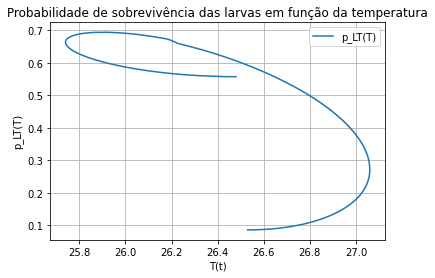

In [36]:
# Usando T_values na ordem que os valores aparecem diariamente

# Usando R_values e T_values previamente calculados
larvae_survival_from_rain_and_temperature_sorted = [lr * lt for lr, lt in zip(larvae_survival_from_rain_sorted, larvae_survival_from_temperature_sorted)]

plt.plot(T_values, larvae_survival_from_rain_and_temperature_sorted, label='p_LT(T)')
plt.title('Probabilidade de sobrevivência das larvas em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('p_LT(T)')
plt.legend()
plt.grid(True)

plt.show() 

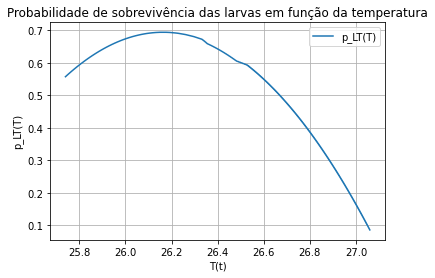

In [37]:
# Usando T_values na ordem crescente

# Usando R_values e T_values previamente calculados
larvae_survival_from_rain_and_temperature_sorted = [lr * lt for lr, lt in zip(larvae_survival_from_rain_sorted, larvae_survival_from_temperature_sorted)]

plt.plot(T_values_array, larvae_survival_from_rain_and_temperature_sorted, label='p_LT(T)')
plt.title('Probabilidade de sobrevivência das larvas em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('p_LT(T)')
plt.legend()
plt.grid(True)

plt.show() 

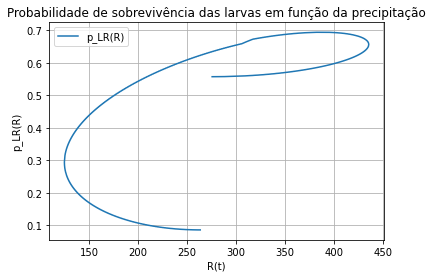

In [38]:
# Usando R_values na ordem que os valores aparecem diariamente

# Usando R_values e T_values previamente calculados
larvae_survival_from_rain_and_temperature_sorted = [lr * lt for lr, lt in zip(larvae_survival_from_rain_sorted, larvae_survival_from_temperature_sorted)]

plt.plot(R_values, larvae_survival_from_rain_and_temperature_sorted, label='p_LR(R)')
plt.title('Probabilidade de sobrevivência das larvas em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('p_LR(R)')
plt.legend()
plt.grid(True)

plt.show() 

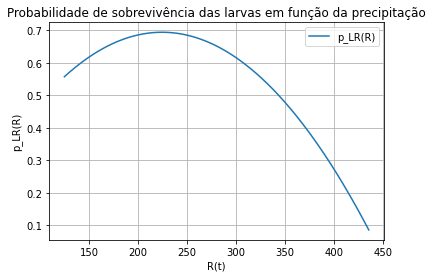

In [39]:
# Usando R_values na ordem crescente

# Usando R_values e T_values previamente calculados
larvae_survival_from_rain_and_temperature_sorted = [lr * lt for lr, lt in zip(larvae_survival_from_rain_sorted, larvae_survival_from_temperature_sorted)]

plt.plot(R_values_array, larvae_survival_from_rain_and_temperature_sorted, label='p_LR(R)')
plt.title('Probabilidade de sobrevivência das larvas em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('p_LR(R)')
plt.legend()
plt.grid(True)

plt.show() 

In [40]:
# def p_ER(t):
#         return (4*p_ME/R_L**2) * R(t) * (max(1e-5,R_L - R(t)))
    
# # Pontos no tempo
# t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
# eggs_survival = [p_ER(t) for t in t_values]

# # Plotando
# plt.plot(t_values, eggs_survival, label='p_ER(R)')
# plt.title('Probabilidade de sobrevivência dos ovos')
# plt.xlabel('t (dias)')
# plt.ylabel('p_ER(R)')
# plt.legend()
# plt.grid(True)
# plt.show()   

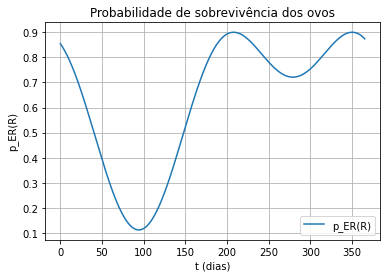

In [41]:
def p_ER_teste(t):
    return (4*p_ME/R_L**2) * R(t) * (R_L - R(t)) 
    
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
eggs_survival = [p_ER_teste(t) for t in t_values]

# Plotando
plt.plot(t_values, eggs_survival, label='p_ER(R)')
plt.title('Probabilidade de sobrevivência dos ovos')
plt.xlabel('t (dias)')
plt.ylabel('p_ER(R)')
plt.legend()
plt.grid(True)
plt.show()    

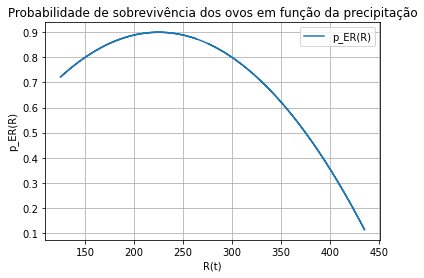

In [42]:
def p_ER_from_rain(rain):
    return (4*p_ME/R_L**2) * rain * (max(1e-5, R_L - rain))    
    
# Usando R_values previamente calculados
eggs_survival_from_rain = [p_ER_from_rain(precip) for precip in R_values]

plt.plot(R_values, eggs_survival_from_rain, label='p_ER(R)')
plt.title('Probabilidade de sobrevivência dos ovos em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('p_ER(R)')
plt.legend()
plt.grid(True)

plt.show()    

In [43]:
# def p_PR(t):
#         return (4*p_MP/R_L**2) * R(t) * (max(1e-5,R_L - R(t)))
    
# # Pontos no tempo
# t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
# pupae_survival = [p_PR(t) for t in t_values]

# # Plotando
# plt.plot(t_values, pupae_survival, label='p_PR(R)')
# plt.title('Probabilidade de sobrevivência das pupas')
# plt.xlabel('t (dias)')
# plt.ylabel('p_PR(R)')
# plt.legend()
# plt.grid(True)
# plt.show()        

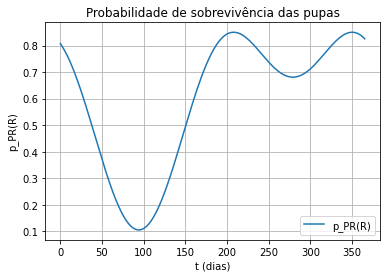

In [44]:
def p_PR_teste(t):
        return (4*p_MP/R_L**2) * R(t) * (R_L - R(t))
    
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
pupae_survival = [p_PR_teste(t) for t in t_values]

# Plotando
plt.plot(t_values, pupae_survival, label='p_PR(R)')
plt.title('Probabilidade de sobrevivência das pupas')
plt.xlabel('t (dias)')
plt.ylabel('p_PR(R)')
plt.legend()
plt.grid(True)
plt.show()  

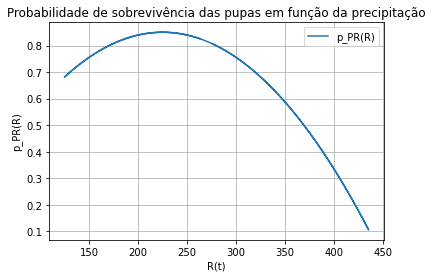

In [45]:
def p_PR_from_rain(rain):
    return (4*p_MP/R_L**2) * rain * (max(1e-5, R_L - rain))    
    
# Usando R_values previamente calculados
pupae_survival_from_rain = [p_PR_from_rain(precip) for precip in R_values]

plt.plot(R_values, pupae_survival_from_rain, label='p_PR(R)')
plt.title('Probabilidade de sobrevivência das pupas em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('p_PR(R)')
plt.legend()
plt.grid(True)

plt.show()  

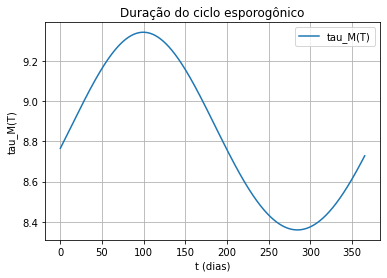

In [46]:
def sporogonic_cycle_duration(t):
        return DD/(max(1e-5, T(t)-Tmin))
    
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
sporogonic_days = [sporogonic_cycle_duration(t) for t in t_values]

# Plotando
plt.plot(t_values, sporogonic_days, label='tau_M(T)')
plt.title('Duração do ciclo esporogônico')
plt.xlabel('t (dias)')
plt.ylabel('tau_M(T)')
plt.legend()
plt.grid(True)
plt.show()

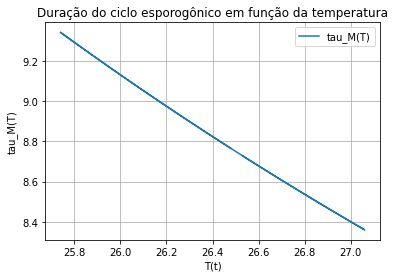

In [47]:
def sporogonic_cycle_duration_from_temperature(temperature):
    return DD/(max(1e-5, temperature-Tmin))

# Usando T_values previamente calculados
sporogonic_days_from_temperature = [sporogonic_cycle_duration_from_temperature(temp) for temp in T_values]

plt.plot(T_values, sporogonic_days_from_temperature, label='tau_M(T)')
plt.title('Duração do ciclo esporogônico em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('tau_M(T)')
plt.legend()
plt.grid(True)

plt.show()

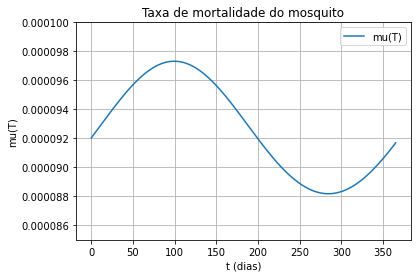

In [48]:
def mortality_rate(t):
    return n(-log(daily_survival_rate(t)))
   
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
mortality_values = [mortality_rate(t) for t in t_values]

# Plotando
plt.plot(t_values, mortality_values, label='mu(T)')
plt.title('Taxa de mortalidade do mosquito')
plt.xlabel('t (dias)')
plt.ylabel('mu(T)')
plt.legend()
plt.grid(True)

# Definindo limites no eixo y
plt.ylim(0.000085, 0.0001)

plt.ticklabel_format(useOffset=False, style='plain')

plt.show()    

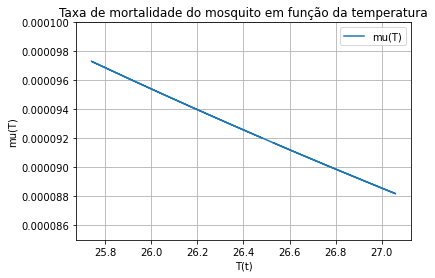

In [49]:
def mortality_rate_from_temperature(temperature):
    return n(-log(daily_survival_rate_from_temperature(temperature)))

# Usando T_values previamente calculados
mortality_values_from_temperature = [mortality_rate_from_temperature(temp) for temp in T_values]

plt.plot(T_values, mortality_values_from_temperature, label='mu(T)')
plt.title('Taxa de mortalidade do mosquito em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('mu(T)')
plt.legend()
plt.grid(True)

# # Definindo limites no eixo y
plt.ylim(0.000085, 0.0001)

plt.ticklabel_format(useOffset=False, style='plain')

plt.show()

In [50]:
# def birth_rate(t):
#     return B_E * p_ER(t) * p_LRT(t) * p_PR(t) / (tau_E + larvae_development_rate(t) + tau_P)
   
# # Pontos no tempo
# t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
# birth_values = [birth_rate(t) for t in t_values]

# # Plotando
# plt.plot(t_values, birth_values, label='b(R, T)')
# plt.title('Taxa de nascimentos diária')
# plt.xlabel('t (dias)')
# plt.ylabel('b(R, T)')
# plt.legend()
# plt.grid(True)
# plt.show()

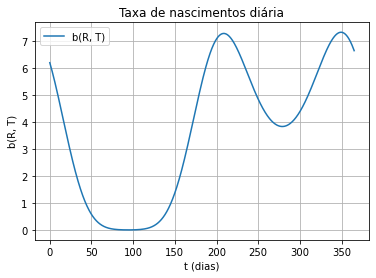

In [51]:
def birth_rate_teste(t):
    return B_E * p_ER_teste(t) * p_LRT_teste(t) * p_PR_teste(t) / (tau_E + larvae_development_rate(t) + tau_P)
   
# Pontos no tempo
t_values = np.linspace(0, 365, 1000) # 1000 pontos entre 0 e 365
birth_values = [birth_rate_teste(t) for t in t_values]

# Plotando
plt.plot(t_values, birth_values, label='b(R, T)')
plt.title('Taxa de nascimentos diária')
plt.xlabel('t (dias)')
plt.ylabel('b(R, T)')
plt.legend()
plt.grid(True)
plt.show()  

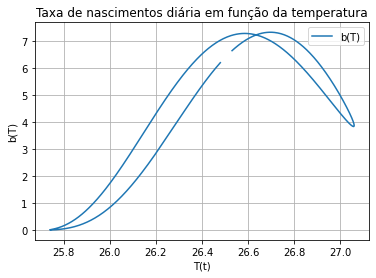

In [52]:
def birth_rate_from_rain_and_temperature(rain, temperature):
    return B_E * p_ER_from_rain(rain) * p_LRT_full(rain, temperature) * p_PR_from_rain(rain) / (tau_E + larvae_development_rate_from_temperature(temperature) + tau_P) 
    
# Usando T_values previamente calculados
birth_values_from_rain_and_temperature = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values, T_values)]

plt.plot(T_values, birth_values_from_rain_and_temperature, label='b(T)')
plt.title('Taxa de nascimentos diária em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('b(T)')
plt.legend()
plt.grid(True)

plt.show() 

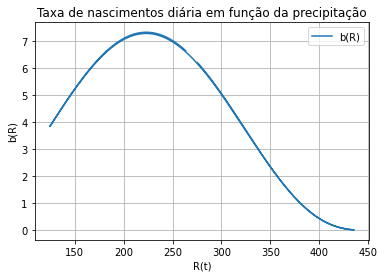

In [53]:
def birth_rate_from_rain_and_temperature(rain, temperature):
    return B_E * p_ER_from_rain(rain) * p_LRT_full(rain, temperature) * p_PR_from_rain(rain) / (tau_E + larvae_development_rate_from_temperature(temperature) + tau_P) 
    
# Usando R_values previamente calculados
birth_values_from_rain_and_temperature = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values, T_values)]

plt.plot(R_values, birth_values_from_rain_and_temperature, label='b(R)')
plt.title('Taxa de nascimentos diária em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('b(R)')
plt.legend()
plt.grid(True)

plt.show() 

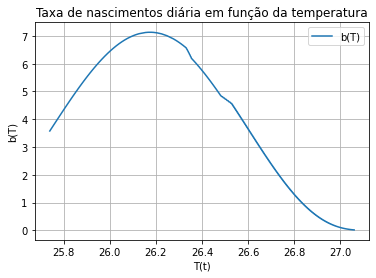

In [54]:
# Usando T_values_array previamente calculados
birth_values_from_rain_and_temperature = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values_array, T_values_array)]

plt.plot(T_values_array, birth_values_from_rain_and_temperature, label='b(T)')
plt.title('Taxa de nascimentos diária em função da temperatura')
plt.xlabel('T(t)')
plt.ylabel('b(T)')
plt.legend()
plt.grid(True)

plt.show() 

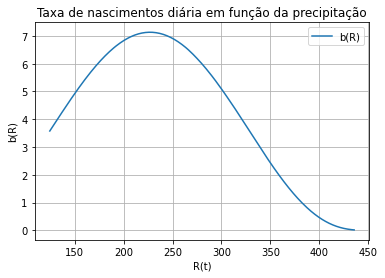

In [55]:
# Usando R_values_array previamente calculados
birth_values_from_rain_and_temperature = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values_array, T_values_array)]

plt.plot(R_values_array, birth_values_from_rain_and_temperature, label='b(R)')
plt.title('Taxa de nascimentos diária em função da precipitação')
plt.xlabel('R(t)')
plt.ylabel('b(R)')
plt.legend()
plt.grid(True)

plt.show() 

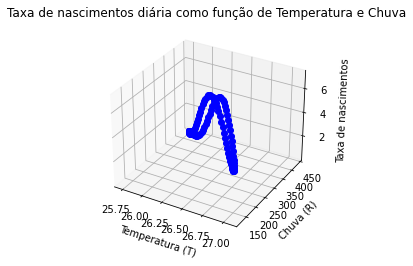

In [56]:
# Pontos no tempo
t_values = np.linspace(0, 365, 100)  # Reduce the number of points for better visualization

# Calcula T, R e taxa de nascimento em cada ponto de t
T_values = [T(t) for t in t_values]
R_values = [R(t) for t in t_values]
birth_values = [birth_rate_teste(t) for t in t_values]

# Cria o plot 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plota a superfície
ax.plot(T_values, R_values, birth_values, marker='o', linestyle='-', color='b')

ax.set_xlabel('Temperatura (T)')
ax.set_ylabel('Chuva (R)')
ax.set_zlabel('Taxa de nascimentos')

ax.set_title('Taxa de nascimentos diária como função de Temperatura e Chuva')

plt.show()

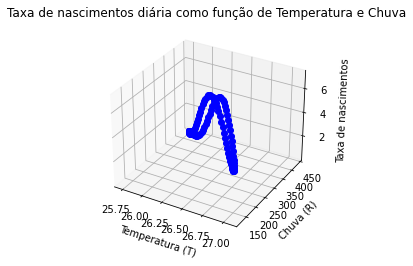

In [57]:
# Pontos no tempo
t_values = np.linspace(0, 365, 100)  # Reduce the number of points for better visualization

# Calcula T, R e taxa de nascimento em cada ponto de t
T_values = [T(t) for t in t_values]
R_values = [R(t) for t in t_values]
birth_values = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values, T_values)]

# Cria o plot 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plota a superfície
ax.plot(T_values, R_values, birth_values, marker='o', linestyle='-', color='b')

ax.set_xlabel('Temperatura (T)')
ax.set_ylabel('Chuva (R)')
ax.set_zlabel('Taxa de nascimentos')

ax.set_title('Taxa de nascimentos diária como função de Temperatura e Chuva')

plt.show()

In [58]:
# # Pontos no tempo
# t_values = np.linspace(0, 365, 100)
# T_values = [T(t) for t in t_values]
# R_values = [R(t) for t in t_values]
# birth_values = [birth_rate_teste(t) for t in t_values]

# # Cria o plot 3D

# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# # Cria a meshgrid para T_values e R_values
# T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# # Cria o plot da superfície
# ax.plot_surface(T_mesh, R_mesh, np.array([birth_values]), cmap='viridis', edgecolor='k', rstride=1, cstride=1, alpha=0.8)

# ax.set_xlabel('Temperatura (T)')
# ax.set_ylabel('Chuva (R)')
# ax.set_zlabel('Taxa de nascimentos')

# ax.set_title('Taxa de nascimentos diária como função de Temperatura e Chuva')

# ax.view_init(elev=20, azim=30)

# plt.show()

In [59]:
# # Pontos no tempo
# t_values = np.linspace(0, 365, 100)
# T_values = [T(t) for t in t_values]
# R_values = [R(t) for t in t_values]
# birth_values = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values, T_values)]

# # Cria o plot 3D

# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# # Cria a meshgrid para T_values e R_values
# T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# # Cria o plot da superfície
# ax.plot_surface(T_mesh, R_mesh, np.array([birth_values]), cmap='viridis', edgecolor='k', rstride=1, cstride=1, alpha=0.8)

# ax.set_xlabel('Temperatura (T)')
# ax.set_ylabel('Chuva (R)')
# ax.set_zlabel('Taxa de nascimentos')

# ax.set_title('Taxa de nascimentos diária como função de Temperatura e Chuva')

# ax.view_init(elev=20, azim=30)

# plt.show()

In [60]:
# t_values = np.linspace(0, 365, 100)
# T_values = T(t_values)
# R_values = R(t_values)

# T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# # Calcula taxa de nascimentos para cada combinação de T e R
# birth_rate_mesh = np.zeros_like(T_mesh)
# for i in range(len(T_values)):
#     for j in range(len(R_values)):
#         birth_rate_mesh[i, j] = birth_rate_teste(t_values[i])

# # Cria o plot 3D 
# fig = plt.figure(figsize=(8, 6))
# ax = fig.add_subplot(111, projection='3d')

# # Plota a superfície
# surface = ax.plot_surface(T_mesh, R_mesh, birth_rate_mesh, cmap='viridis', edgecolor='k')

# ax.set_xlabel('T(t)')
# ax.set_ylabel('R(t)')
# ax.set_zlabel('b(t)')
# ax.set_title('Taxa de nascimentos diária como função de Temperatura e Chuva')

# ax.set_xlim(np.min(T_values)-0.25, np.max(T_values)+0.25)

# # Add color bar
# fig.colorbar(surface, ax=ax, shrink=0.5, aspect=10)

# # Show the plot
# plt.show()

In [61]:
# t_values = np.linspace(0, 365, 100)
# T_values = T(t_values)
# R_values = R(t_values)

# T_mesh, R_mesh = np.meshgrid(T_values, R_values)


# #birth_values = [birth_rate_from_rain_and_temperature(precip, temp) for precip, temp in zip(R_values, T_values)]


# # Calcula taxa de nascimentos para cada combinação de T e R
# birth_rate_mesh = np.zeros_like(T_mesh)
# for i in range(len(T_values)):
#     for j in range(len(R_values)):
#         birth_rate_mesh[i, j] = birth_rate_from_rain_and_temperature(R_values[j], T_values[i])

# # Cria o plot 3D 
# fig = plt.figure(figsize=(8, 6))
# ax = fig.add_subplot(111, projection='3d')

# # Plota a superfície
# surface = ax.plot_surface(T_mesh, R_mesh, birth_rate_mesh, cmap='viridis', edgecolor='k')

# ax.set_xlabel('T(t)')
# ax.set_ylabel('R(t)')
# ax.set_zlabel('b(t)')
# ax.set_title('Taxa de nascimentos diária como função de Temperatura e Chuva')

# ax.set_xlim(np.min(T_values)-0.25, np.max(T_values)+0.25)

# # Add color bar
# fig.colorbar(surface, ax=ax, shrink=0.5, aspect=10)

# # Show the plot
# plt.show()

In [62]:
t_values = np.linspace(0, 365, 100)  

# Calcula valores correspondentes de T, R e b
T_values = T(t_values)
R_values = R(t_values)
b_values = birth_rate_teste(t_values)

# Cria um scatter plot3D 
fig = go.Figure(data=[go.Scatter3d(x=T_values, y=R_values, z=b_values, mode='markers')])

# Adiciona legenda nos eixos
fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(t)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

In [63]:
t_values = np.linspace(0, 365, 100)
T_values = T(t_values)
R_values = R(t_values)

T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# Calcula taxa de nascimentos para cada combinação de T e R
birth_rate_mesh = np.zeros_like(T_mesh)
for i in range(len(T_values)):
    for j in range(len(R_values)):
        birth_rate_mesh[i, j] = birth_rate_teste(t_values[i])

fig = go.Figure(data=[go.Surface(z=birth_rate_mesh, x=T_mesh, y=R_mesh, colorscale='viridis')])

fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(R,T)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

In [64]:
t_values = np.linspace(0, 365, 100)
T_values = T(t_values)
R_values = R(t_values)

T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# Calcula taxa de nascimentos para cada combinação de T e R
birth_rate_mesh = np.zeros_like(T_mesh)
for i in range(len(T_values)):
    for j in range(len(R_values)):
        birth_rate_mesh[i, j] = birth_rate_teste(t_values[j])

fig = go.Figure(data=[go.Surface(z=birth_rate_mesh, x=T_mesh, y=R_mesh, colorscale='viridis')])

fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(R,T)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

In [65]:
t_values = np.linspace(0, 365, 100)
T_values = T(t_values)
R_values = R(t_values)

T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# Calcula taxa de nascimentos para cada combinação de T e R
birth_rate_mesh = np.zeros_like(T_mesh)
for i in range(len(T_values)):
    for j in range(len(R_values)):
        birth_rate_mesh[i, j] = birth_rate_from_rain_and_temperature(R_values[j], T_values[i])

fig = go.Figure(data=[go.Surface(z=birth_rate_mesh, x=T_mesh, y=R_mesh, colorscale='viridis')])

fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(R,T)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

In [66]:
t_values = np.linspace(0, 365, 100)
T_values = T(t_values)
R_values = R(t_values)

T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# Calcula taxa de nascimentos para cada combinação de T e R
birth_rate_mesh = np.zeros_like(T_mesh)
for i in range(len(T_values)):
    for j in range(len(R_values)):
        birth_rate_mesh[i, j] = birth_rate_from_rain_and_temperature(R_values[i], T_values[j])

fig = go.Figure(data=[go.Surface(z=birth_rate_mesh, x=T_mesh, y=R_mesh, colorscale='viridis')])

fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(R,T)'),
                  scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

fig.show()

In [67]:
# t_values = np.linspace(0, 365, 100)
# T_values = T(t_values)
# R_values = R(t_values)

# T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# # Calcula taxa de nascimentos para cada combinação de T e R
# birth_rate_mesh = np.zeros_like(T_mesh)
# for i in range(len(T_values)):
#     for j in range(len(R_values)):
#         birth_rate_mesh[i, j] = birth_rate_from_rain_and_temperature(R_values_array[j], T_values_array[j])

# fig = go.Figure(data=[go.Surface(z=birth_rate_mesh, x=T_mesh, y=R_mesh, colorscale='viridis')])

# fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(R,T)'),
#                   scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

# fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

# fig.show()

In [68]:
# t_values = np.linspace(0, 365, 100)
# T_values = T(t_values)
# R_values = R(t_values)

# T_mesh, R_mesh = np.meshgrid(T_values, R_values)

# # Calcula taxa de nascimentos para cada combinação de T e R
# birth_rate_mesh = np.zeros_like(T_mesh)
# for i in range(len(T_values)):
#     for j in range(len(R_values)):
#         birth_rate_mesh[i, j] = birth_rate_from_rain_and_temperature(R_values_array[i], T_values_array[i])

# fig = go.Figure(data=[go.Surface(z=birth_rate_mesh, x=T_mesh, y=R_mesh, colorscale='viridis')])

# fig.update_layout(scene=dict(xaxis_title='T(t)', yaxis_title='R(t)', zaxis_title='b(R,T)'),
#                   scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1.5)))

# fig.update_layout(title='Taxa de nascimentos diária como função de Temperatura e Chuva')

# fig.show()